# Case study: Epithelial cells in different intestinal regions by 10x Chromium

This ipython notebook is part of the Molecular Systems Biology submission 'Best practices in single-cell RNA-seq analysis: a tutorial'. 

Here, a data set of different regions of the mouse intestinal epithelium from (Haber et al. 2018) is analysed using a variety of tools. This notebook is intended to illustrate a typical single-cell RNA-seq analysis pipeline using current best practices and common tools. 

The data set contains ~13,000 cells of which approximately a third come from the duodenum, the jejunum, and the ileum. These are regions of the mouse intestinal epithelium (IE). The duodenum and the jejunum are in the proximal IE, while the ileum is the distal IE. 

If the relevant libraries and modules have been installed on the system, they must be loaded. The scanpy api gives access to all tools availalbe via the scanpy platform. Numpy and scipy are useful scientific computing libraries that are used by scanpy, and pandas is used to load in the data. Pandas is also the basis of the data structures used in scanpy (the Anndata module). Matplotlib and seaborn are used for plotting.

R libraries that are used in this tutorial include:
- scran for preprocessing
- MAST for differential expression analysis
- slingshot for pseudotime and trajectory inference
- monocle2 for pseudotime and trajectory inference
- gam for finding genes that change over pseudotime
- RColorBrewer and clusterExperiment for visualization in R
- ComplexHeatmap for heatmap plotting


#### Timing
The notebook takes approximately 2 hours and 9 minutes to run on a single core with sufficient RAM. The vast majority of this time is taken up by the trajectory inference and gene expression dynamics sections, which take over 1 hour and 40 minutes. Timings of the individual sections are given in the notebook. It should be expected that timings will vary in each run.

## Table of contents:

  * <a href=#Reading>1 Reading in the data</a>
  * <a href=#Preprocessing>2 Pre-processing and visualization</a>
    * <a href=#QC>2.1 Quality Control</a>
    * <a href=#Normalization>2.2 Normalization</a> 
    * <a href=#Batch>2.3 Batch correction</a>
    * <a href=#HVG>2.4 Highly variable genes</a>
    * <a href=#Visualization>2.5 Visualization</a>
    * <a href=#CC>2.6 Cell cycle scoring</a>
  * <a href=#Downstream>3 Downstream analysis</a>
    * <a href=#Clustering>3.1 Clustering</a>
    * <a href=#Markers>3.2 Marker genes & cluster annotation</a>
    * <a href=#Subclustering>3.3 Subclustering</a>
    * <a href=#Compositions>3.4 Compositional analysis</a>
    * <a href=#TI>3.5 Trajectory inference</a>
      * <a href=#Slingshot>3.5.1 Slingshot</a>
      * <a href=#Slingshot_nbc>3.5.2 Slingshot (w/o batch correction)</a>
      * <a href=#Monocle>3.5.3 Monocle</a>
      * <a href=#DPT>3.5.4 Diffusion Pseudotime</a>
    * <a href=#Gene_dynamics>3.6 Gene expression dynamics</a>
    * <a href=#Metastable>3.7 Metastable states</a>
    * <a href=#PAGA>3.8 Partition-based graph abstraction</a>
    * <a href=#Gene-level>3.9 Gene-level analysis</a>
      * <a href=#Diff_expr>3.9.1 Differential expression</a>
      * <a href=#Gene_set>3.9.2 Gene set analysis</a>
    * <a href=#Write>3.10 Writing to file</a>
  * <a href=#Summary>4 Summary</a>
    * <a href=#Comparison>4.1 Comparison with published results</a>

# 0. Loading the libraries

In [1]:
import scanpy as sc
import numpy as np
import scipy as sp
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib import colors
import seaborn as sb
from gprofiler import GProfiler

import rpy2.rinterface_lib.callbacks
import logging

from rpy2.robjects import pandas2ri
import anndata2ri

In [2]:
# Ignore R warning messages
#Note: this can be commented out to get more verbose R output
rpy2.rinterface_lib.callbacks.logger.setLevel(logging.ERROR)

# Automatically convert rpy2 outputs to pandas dataframes
pandas2ri.activate()
anndata2ri.activate()
%load_ext rpy2.ipython

plt.rcParams['figure.figsize']=(8,8) #rescale figures
sc.settings.verbosity = 3
#sc.set_figure_params(dpi=200, dpi_save=300)
sc.logging.print_versions()

scanpy==1.4.6 anndata==0.7.1 umap==0.4.0 numpy==1.18.2 scipy==1.4.1 pandas==1.0.3 scikit-learn==0.22.2.post1 statsmodels==0.11.1 python-igraph==0.8.0 louvain==0.6.1


In [3]:
%%R
# Load libraries from correct lib Paths for my environment - ignore this!
.libPaths(.libPaths()[c(3,2,1)])

# Load all the R libraries we will be using in the notebook
library(scran)
library(RColorBrewer)
library(slingshot)
library(monocle)
library(gam)
library(clusterExperiment)
library(ggplot2)
library(plyr)
library(MAST)

<a id="Reading"></a>

# 1. Reading in the data

The Haber et al. data set was retrieved from the Gene Expression Omnibus (GEO) via the ID GSE92332. The regional single cell expression data sets were extracted from the GSE92332_RAW.tar file (https://www.ncbi.nlm.nih.gov/geo/download/?acc=GSE92332&format=file) and are loaded by scanpy's read function. Note that single cell data exists in many formats and loading data may therefore require preprocessing. Packages like Scanpy and Seurat facilitate the data loading process by supporting several sparse and dense data formats in their read functions. When adapting the tutorial code to your own dataset, you will likely have to make changes to this section to match to the format of your data.

Here, we are reading in sparse count matrices, but are immediately converting these to dense representation with the .toarray() function. We create dense matrices as our batch correction method outputs a dense expression matrix, and the data transfer between R and python is currently limited to dense matrices. When sparse batch correction methods are available, and rpy2 is extended to sparse matrices, it is more memory-efficient to keep the data in a sparse format.

It should also be noted that the conventions for storing single cell data differ between R (Seurat, or Scater) and python platforms (Scanpy). Scanpy expects the data to be stored in the format cells x genes, while R platforms expect the transpose. As data is typically stored in the format genes x cells in the GEO, we must transpose the data before using it.

Finally, the `Macosko_cell_cycle_genes.txt` contains a list of marker genes for different cell cycle phases. It can be ignored for now. We come back to this file in the <a href=#CC>Cell cycle scoring</a> section.

[Timing: 18.7s reading from cache]

In [4]:
# Set up data loading

#Data files
sample_strings = ['Duo_M1', 'Duo_M2', 'Jej_M1', 'Jej_M2', 'Il_M1', 'Il_M2']
sample_id_strings = ['3', '4', '5', '6', '7', '8']
file_base = '../data/Haber-et-al_mouse-intestinal-epithelium/GSE92332_RAW/GSM283657'
exp_string = '_Regional_'
data_file_end = '_matrix.mtx'
barcode_file_end = '_barcodes.tsv'
gene_file_end = '_genes.tsv'
cc_genes_file = '../Macosko_cell_cycle_genes.txt'

In [5]:
# First data set load & annotation
#Parse Filenames
sample = sample_strings.pop(0)
sample_id = sample_id_strings.pop(0)
data_file = file_base+sample_id+exp_string+sample+data_file_end
barcode_file = file_base+sample_id+exp_string+sample+barcode_file_end
gene_file = file_base+sample_id+exp_string+sample+gene_file_end

#Load data
adata = sc.read(data_file, cache=True)
adata = adata.transpose()
adata.X = adata.X.toarray()

barcodes = pd.read_csv(barcode_file, header=None, sep='\t')
genes = pd.read_csv(gene_file, header=None, sep='\t')

#Annotate data
barcodes.rename(columns={0:'barcode'}, inplace=True)
barcodes.set_index('barcode', inplace=True)
adata.obs = barcodes
adata.obs['sample'] = [sample]*adata.n_obs
adata.obs['region'] = [sample.split("_")[0]]*adata.n_obs
adata.obs['donor'] = [sample.split("_")[1]]*adata.n_obs

genes.rename(columns={0:'gene_id', 1:'gene_symbol'}, inplace=True)
genes.set_index('gene_symbol', inplace=True)
adata.var = genes


... reading from cache file cache/..-data-Haber-et-al_mouse-intestinal-epithelium-GSE92332_RAW-GSM2836573_Regional_Duo_M1_matrix.h5ad


In [6]:
# Loop to load rest of data sets
for i in range(len(sample_strings)):
    #Parse Filenames
    sample = sample_strings[i]
    sample_id = sample_id_strings[i]
    data_file = file_base+sample_id+exp_string+sample+data_file_end
    barcode_file = file_base+sample_id+exp_string+sample+barcode_file_end
    gene_file = file_base+sample_id+exp_string+sample+gene_file_end
    
    #Load data
    adata_tmp = sc.read(data_file, cache=True)
    adata_tmp = adata_tmp.transpose()
    adata_tmp.X = adata_tmp.X.toarray()

    barcodes_tmp = pd.read_csv(barcode_file, header=None, sep='\t')
    genes_tmp = pd.read_csv(gene_file, header=None, sep='\t')
    
    #Annotate data
    barcodes_tmp.rename(columns={0:'barcode'}, inplace=True)
    barcodes_tmp.set_index('barcode', inplace=True)
    adata_tmp.obs = barcodes_tmp
    adata_tmp.obs['sample'] = [sample]*adata_tmp.n_obs
    adata_tmp.obs['region'] = [sample.split("_")[0]]*adata_tmp.n_obs
    adata_tmp.obs['donor'] = [sample.split("_")[1]]*adata_tmp.n_obs
    
    genes_tmp.rename(columns={0:'gene_id', 1:'gene_symbol'}, inplace=True)
    genes_tmp.set_index('gene_symbol', inplace=True)
    adata_tmp.var = genes_tmp
    adata_tmp.var_names_make_unique()

    # Concatenate to main adata object
    adata = adata.concatenate(adata_tmp, batch_key='sample_id')
    if 'gene_id-1' in adata.var.columns:
        adata.var['gene_id'] = adata.var['gene_id-1']
        adata.var.drop(columns = ['gene_id-1', 'gene_id-0'], inplace=True)
    adata.obs.drop(columns=['sample_id'], inplace=True)
    adata.obs_names = [c.split("-")[0] for c in adata.obs_names]
    adata.obs_names_make_unique(join='_')

... reading from cache file cache/..-data-Haber-et-al_mouse-intestinal-epithelium-GSE92332_RAW-GSM2836574_Regional_Duo_M2_matrix.h5ad
Making variable names unique for controlled concatenation.
... reading from cache file cache/..-data-Haber-et-al_mouse-intestinal-epithelium-GSE92332_RAW-GSM2836575_Regional_Jej_M1_matrix.h5ad
... reading from cache file cache/..-data-Haber-et-al_mouse-intestinal-epithelium-GSE92332_RAW-GSM2836576_Regional_Jej_M2_matrix.h5ad
... reading from cache file cache/..-data-Haber-et-al_mouse-intestinal-epithelium-GSE92332_RAW-GSM2836577_Regional_Il_M1_matrix.h5ad
... reading from cache file cache/..-data-Haber-et-al_mouse-intestinal-epithelium-GSE92332_RAW-GSM2836578_Regional_Il_M2_matrix.h5ad


Note that this next line just cleans up the variable names which are stored as `mm10_` + MGI gene symbol in this dataset.

In [7]:
#Assign variable names and gene id columns
adata.var_names = [g.split("_")[1] for g in adata.var_names]
adata.var['gene_id'] = [g.split("_")[1] for g in adata.var['gene_id']]

Once the data is read in and annotated, we test whether we have the expected number of cells for each region, mouse (donor), and sample.

In [8]:
# Annotate the data sets
print(adata.obs['region'].value_counts())
print('')
print(adata.obs['donor'].value_counts())
print('')
print(adata.obs['sample'].value_counts())

Duo    4554
Jej    4496
Il     4303
Name: region, dtype: int64

M2    6711
M1    6642
Name: donor, dtype: int64

Jej_M2    2668
Il_M1     2466
Duo_M1    2348
Duo_M2    2206
Il_M2     1837
Jej_M1    1828
Name: sample, dtype: int64


We have 4554, 4496, and 4303 cells from the Duodenum, Jejunum, and Ileum respectively.

In [9]:
# Checking the total size of the data set
adata.shape

(13353, 27998)

We have 13,353 cells and 27,998 genes in the dataset.

<a id="Preprocessing"></a>

# 2 Pre-processing and visualization

<a id="QC"></a>

## 2.1 Quality control

Data quality control can be split into cell QC and gene QC. Typical quality measures for assessing the quality of a cell include the number of molecule counts (UMIs), the number of expressed genes, and the fraction of counts that are mitochondrial. A high fraction of mitochondrial reads being picked up can indicate cell stress, as there is a low proportion of nuclear mRNA in the cell. It should be noted that high mitochondrial RNA fractions can also be biological signals indicating elevated respiration.

[Timing: 39.9s]

In [10]:
# Quality control - calculate QC covariates
adata.obs['n_counts'] = adata.X.sum(1)
adata.obs['log_counts'] = np.log(adata.obs['n_counts'])
adata.obs['n_genes'] = (adata.X > 0).sum(1)

mt_gene_mask = [gene.startswith('mt-') for gene in adata.var_names]
adata.obs['mt_frac'] = adata.X[:, mt_gene_mask].sum(1)/adata.obs['n_counts']

... storing 'donor' as categorical
... storing 'region' as categorical
... storing 'sample' as categorical


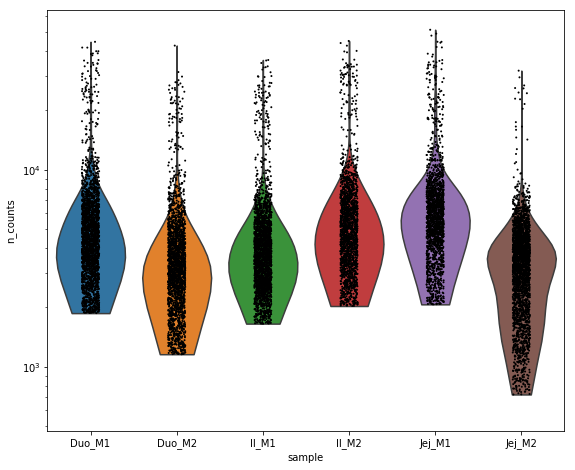

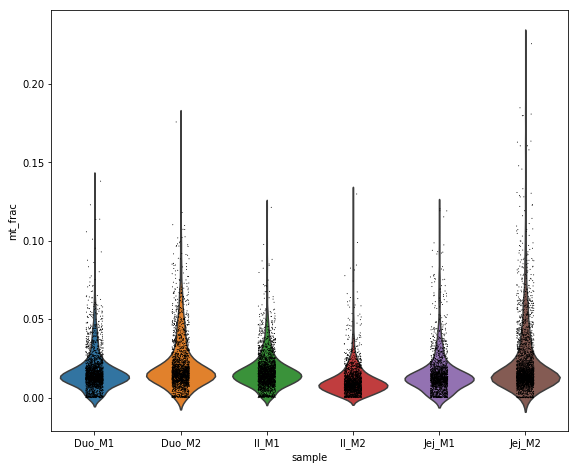

In [11]:
# Quality control - plot QC metrics
#Sample quality plots
t1 = sc.pl.violin(adata, 'n_counts', groupby='sample', size=2, log=True, cut=0)
t2 = sc.pl.violin(adata, 'mt_frac', groupby='sample')

The plots show that the Jej_M2 sample has the poorest quality in comparison. The counts per cell are still sufficiently high to process these cells, and the fraction of mitochondrial reads (MT frac) for most cells are still far below 20-25%, which are the typical filtering thresholds.

We could perform QC filtering per sample here to address this issue, yet the mode of the distributions look similar to other samples (e.g., 'Il_M1'). It may be worth keeping in mind that one sample has a few poorer quality cells though.

... storing 'donor' as categorical
... storing 'region' as categorical
... storing 'sample' as categorical


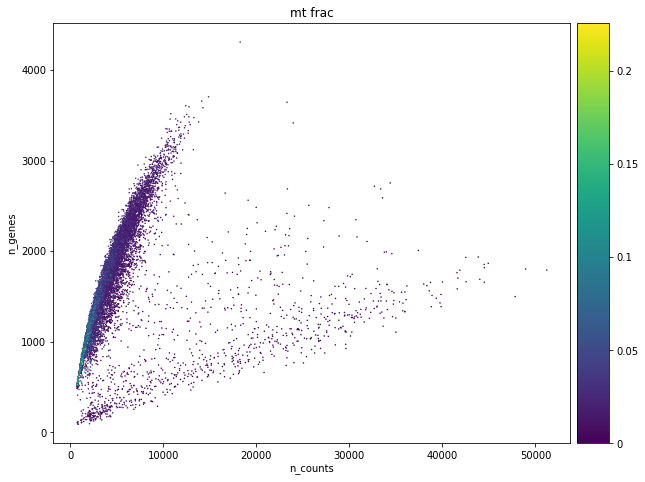

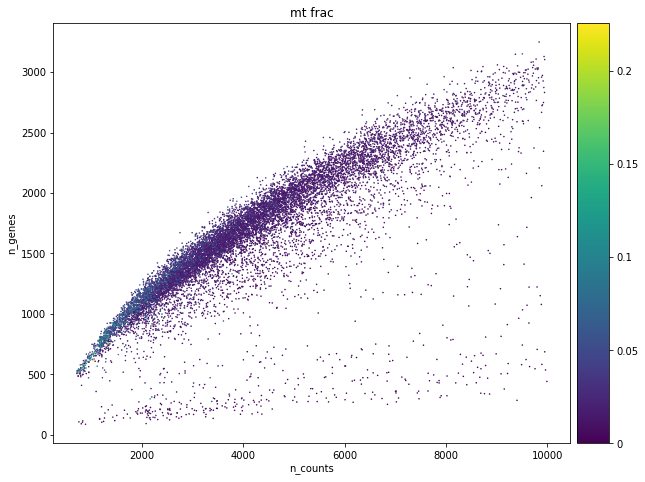

In [11]:
#Data quality summary plots
p1 = sc.pl.scatter(adata, 'n_counts', 'n_genes', color='mt_frac')
p2 = sc.pl.scatter(adata[adata.obs['n_counts']<10000], 'n_counts', 'n_genes', color='mt_frac')

By looking at plots of the number of genes versus the number of counts with MT fraction information, we can assess whether there cells with unexpected summary statistics. It is important here to look at these statistics jointly. For example, there is a cloud of points with many counts, but few genes. Our first instinct would be to filter out these as "dying" outliers, however they don't seem to show high MT fraction. We should probably still filter out some cells with very few genes as these may be difficult to annotate later. This will be true for the initial cellular density between 1000-4000 counts and < ~500 genes.

Furthermore it can be seen in the main cloud of data points, that cells with lower counts and genes tend to have a higher fraction of mitochondrial counts. These cells are likely under stress or are dying. When apoptotic cells are sequenced, there is less mRNA to be captured in the nucleus, and therefore fewer counts overall, and thus a higher fraction of counts fall upon mitochondrial RNA. If cells with high mitochondrial activity were found at higher counts/genes per cell, this would indicate biologically relevant mitochondrial activity.

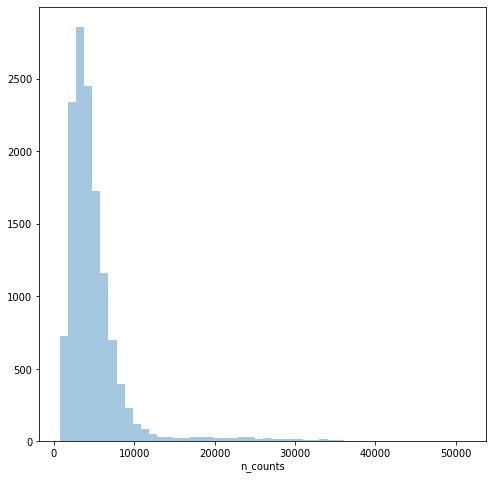

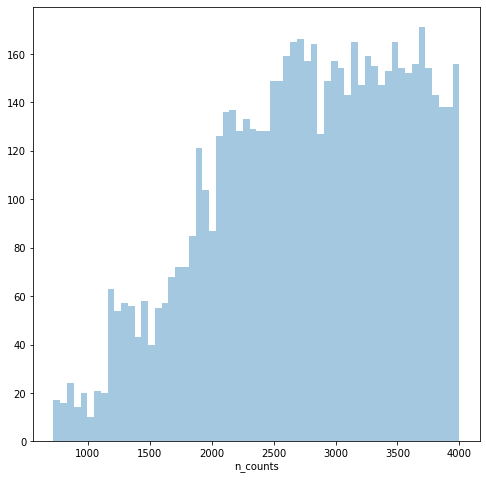

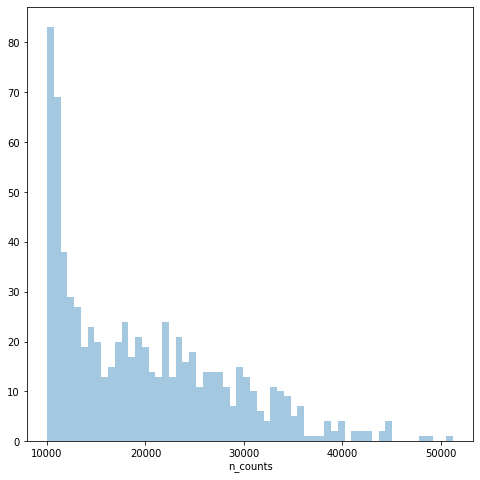

In [12]:
#Thresholding decision: counts
p3 = sb.distplot(adata.obs['n_counts'], kde=False)
plt.show()

p4 = sb.distplot(adata.obs['n_counts'][adata.obs['n_counts']<4000], kde=False, bins=60)
plt.show()

p5 = sb.distplot(adata.obs['n_counts'][adata.obs['n_counts']>10000], kde=False, bins=60)
plt.show()

Histograms of the number of counts per cell show that there are two small peaks of groups of cells with fewer than 1500 counts. which are likely uninformative given the overall distribution of counts. This may be cellular debris found in droplets.

On the upper end of counts, we see a population of cells with high counts shown as a broad peak at 20,000 counts. We estimate this population to range until 40,000 counts. This estimation is performed by visually tracing a Gaussian around the population.

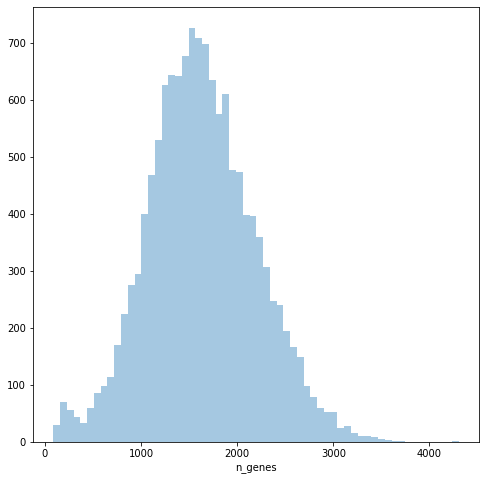

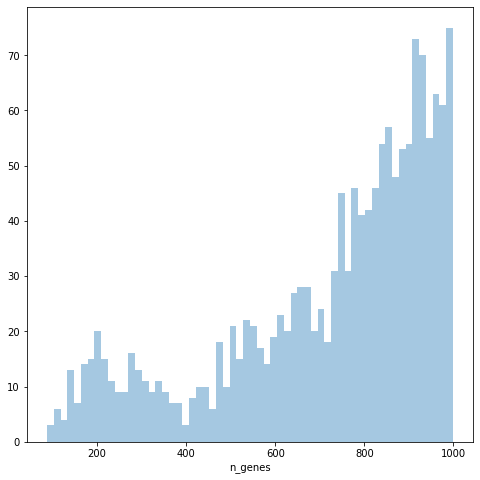

In [13]:
#Thresholding decision: genes
p6 = sb.distplot(adata.obs['n_genes'], kde=False, bins=60)
plt.show()

p7 = sb.distplot(adata.obs['n_genes'][adata.obs['n_genes']<1000], kde=False, bins=60)
plt.show()


Two populations of cells with low gene counts can be seen in the above plots. Given these plots, and the plot of genes vs counts above, we decide to filter out cells with fewer than 700 genes expressed. Below this we are likely to find dying cells or empty droplets with ambient RNA. Looking above at the joint plots, we see that we filter out the main density of low gene cells with this threshold.

In general it is a good idea to be permissive in the early filtering steps, and then come back to filter out more stringently when a clear picture is available of what would be filtered out. This is available after visualization/clustering. For demonstration purposes we stick to a simple (and slightly more stringent) filtering here.

In [14]:
# Filter cells according to identified QC thresholds:
print('Total number of cells: {:d}'.format(adata.n_obs))

sc.pp.filter_cells(adata, min_counts = 1500)
print('Number of cells after min count filter: {:d}'.format(adata.n_obs))

sc.pp.filter_cells(adata, max_counts = 40000)
print('Number of cells after max count filter: {:d}'.format(adata.n_obs))

adata = adata[adata.obs['mt_frac'] < 0.2]
print('Number of cells after MT filter: {:d}'.format(adata.n_obs))

sc.pp.filter_cells(adata, min_genes = 700)
print('Number of cells after gene filter: {:d}'.format(adata.n_obs))




Total number of cells: 13353
filtered out 479 cells that have less than 1500 counts
Number of cells after min count filter: 12874
filtered out 16 cells that have more than 40000 counts
Number of cells after max count filter: 12858
Number of cells after MT filter: 12858
filtered out 401 cells that have less than 700 genes expressed
Trying to set attribute `.obs` of view, copying.
Number of cells after gene filter: 12457


In [15]:
#Filter genes:
print('Total number of genes: {:d}'.format(adata.n_vars))

# Min 20 cells - filters out 0 count genes
sc.pp.filter_genes(adata, min_cells=20)
print('Number of genes after cell filter: {:d}'.format(adata.n_vars))

Total number of genes: 27998
filtered out 15180 genes that are detected in less than 20 cells
Number of genes after cell filter: 12818


The filtering is performed based on the thresholds we identified from the QC plots. Genes are also filtered if they are not detected in at least 20 cells. This reduces the dimensions of the matrix by removing 0 count genes and genes which are not sufficiently informative of the dataset. 

<a id="Normalization"></a>

## 2.2 Normalization

Up to this point the data is only available as a count matrix. Counts are representative of molecules that were captured in the scRNA-seq experiment. As not all mRNA molecules in a cell are captured, there is a variability in the total number of counts detected between cells that results from both the number of molecules that were in the cells, and the sampling. As we cannot assume that all cells contain an equal number of molecules (cell sizes can differ substantially), we have to estimate the number of molecules that were initially in the cells. In fact, we don't estimate the exact number of molecules, but instead estimate cell-specific factors that should be proportional to the true number of molecules. These are called size factors. Normalized expression values are calculated by dividing the measured counts by the size factor for the cell.

Based on comparisons of normalization methods for differential testing (personal communication from Beathe Vieth), and batch correction [Buettner et al., 2019], the normalization method implemented in the scran package performs best. This method requires a coarse clustering input to improve size factor esimation performance. Thus, we use a simple preprocessing approach and cluster the data at a low resolution to get an input for the size factor estimation. The basic preprocessing includes assuming all size factors are equal (library size normalization to counts per million - CPM) and log-transforming the count data.

[Timing: 2min 46.73s; 2min 22s of which in scran R code]

In [16]:
#Perform a clustering for scran normalization in clusters
adata_pp = adata.copy()
sc.pp.normalize_per_cell(adata_pp, counts_per_cell_after=1e6)
sc.pp.log1p(adata_pp)
sc.pp.pca(adata_pp, n_comps=15)
sc.pp.neighbors(adata_pp)
sc.tl.louvain(adata_pp, key_added='groups', resolution=0.5)

normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
computing PCA with n_comps = 15
    finished (0:00:05)
computing neighbors
    using 'X_pca' with n_pcs = 15
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:19)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 10 clusters and added
    'groups', the cluster labels (adata.obs, categorical) (0:00:03)


In [17]:
#Preprocess variables for scran normalization
input_groups = adata_pp.obs['groups']
data_mat = adata.X.T

In [18]:
%%R -i data_mat -i input_groups -o size_factors

size_factors = computeSumFactors(data_mat, clusters=input_groups, min.mean=0.1)

In [19]:
#Delete adata_pp
del adata_pp

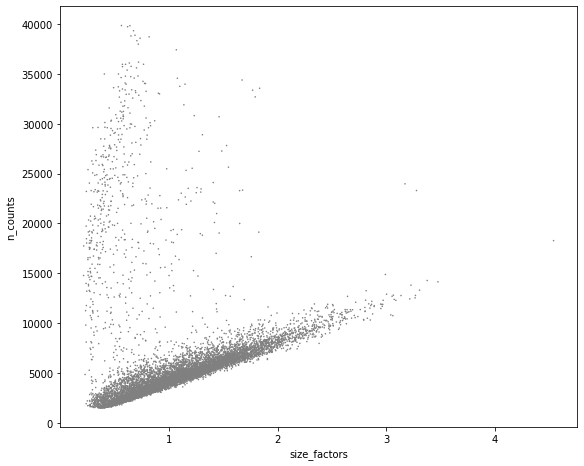

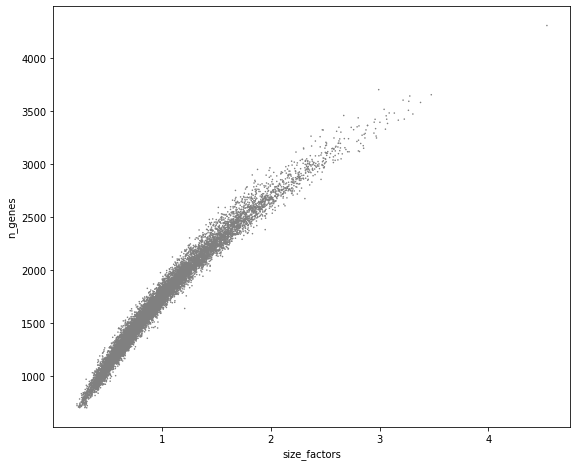

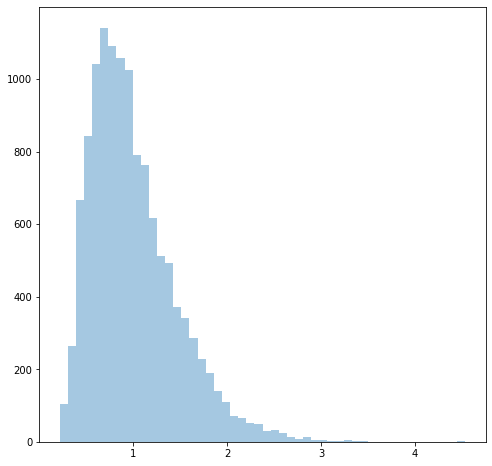

In [20]:
# Visualize the estimated size factors
adata.obs['size_factors'] = size_factors

sc.pl.scatter(adata, 'size_factors', 'n_counts')
sc.pl.scatter(adata, 'size_factors', 'n_genes')

sb.distplot(size_factors, bins=50, kde=False)
plt.show()

We plot the size factors to show they are non-negative and related to the number of counts and genes per cell as expected.

Before normalizing the data, we ensure that a copy of the raw count data is kept in a separate AnnData object. This allows us to use methods downstream that require this data as input.

In [21]:
#Keep the count data in a counts layer
adata.layers["counts"] = adata.X.copy()

In [22]:
#Normalize adata 
adata.X /= adata.obs['size_factors'].values[:,None]
sc.pp.log1p(adata)

In [23]:
# Store the full data set in 'raw' as log-normalised data for statistical testing
adata.raw = adata

The count data has been normalized and log-transformed with an offset of 1. The latter is performed to normalize the data distributions. The offset of 1 ensures that zero counts map to zeros. We keep this data in the '.raw' part of the AnnData object as it will be used to visualize gene expression and perform statistical tests such as computing marker genes for clusters.

<a id="Batch"></a>

## 2.3 Batch Correction

<a id="Monocle"></a>

continue code here:

In [ ]:
# continue